# 데이터 불러오기

In [182]:
# 끝자리가 7로 끝나는 데이터만 가져오기
data = open("20240705-171717_DecaWaveAllAccum.log", "r")
data_log = []
i = 0

for line in data:
    if len(line) > 1000:
        data_log.append(line)

In [183]:
len(data_log)

3540

In [184]:
data_log[0][:132]  # 없애야할 부분

'RX E\x00 WInd(0735), PSC(0449), CE(0000), RSE(0000), HE(0000), STO(0001), FFE(0000), T(7EB4), RSL(-085.1200), FSL(-086.2409), RSMPL(01)'

In [185]:
processed_data = []

# 데이터 순회
for i in data_log:
    # 알파벳이 포함된 경우
    if any(c.isalpha() for c in i):
        # "RSMPL(01)" 문자열의 위치 찾기
        index = i.find("RSMPL")
        # 해당 위치가 유효한 경우
        if index != -1:
            # "RSMPL(01)"까지의 문자열 제거
            i = i[index + len("RSMPL")+4:]
            processed_data.append(i)
        else:
            # "RSMPL(01)" 문자열이 없는 경우, 원본 데이터 추가
            processed_data.append(i)
    else:
        # 알파벳이 없는 경우, 원본 데이터 추가
        processed_data.append(i)

# 처리된 데이터 출력
for item in processed_data:
    print(item)

315,748,490,71,427,785,576,594,560,564,662,649,447,473,867,586,345,692,650,498,864,793,342,228,439,644,354,193,671,765,760,723,525,408,547,322,703,768,439,104,511,1151,1116,147,85,616,897,919,983,473,611,658,328,108,663,847,423,519,641,111,780,653,90,507,722,266,206,453,820,655,195,281,668,482,353,644,564,344,639,600,583,1041,637,922,1078,530,218,884,864,423,395,821,663,539,515,570,894,843,503,219,617,538,458,727,625,537,539,870,598,413,621,362,118,477,631,405,230,-130,518,941,402,4,246,480,537,484,382,753,488,364,302,486,190,177,721,574,608,569,585,781,731,481,964,387,76,113,573,421,760,582,170,492,729,727,398,687,703,587,866,315,528,511,173,435,882,989,519,412,539,471,90,435,653,741,948,997,385,189,803,852,605,593,483,613,711,614,34,433,644,544,586,897,658,374,541,788,754,433,265,865,674,435,513,84,445,372,631,833,752,685,591,466,536,560,651,331,426,368,294,423,338,112,571,478,269,619,634,399,541,699,392,470,581,350,483,180,233,630,705,244,86,-65,673,1143,631,622,757,746,351,559,787,

In [186]:
data_log = processed_data
raw_data = []

for i in range(len(data_log)):
    data_sample = [int(x) for x in data_log[i].strip().split(",") if x]
    raw_data.append(data_sample)

In [187]:
len(raw_data[0])
for i in range(10):
    print(len(raw_data[i]))

2032
1016
1016
2032
1016
2032
1016
1016
1016
1016


In [188]:
import pandas as pd
import matplotlib.pyplot as plt

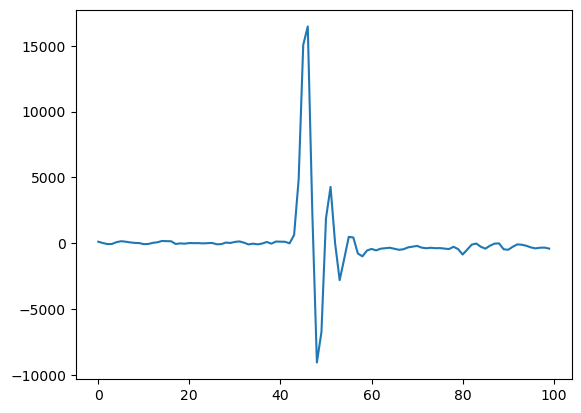

In [193]:
plt.clf()
plt.plot(raw_data[10][700:800])
plt.savefig("raw_data.png")

<Axes: >

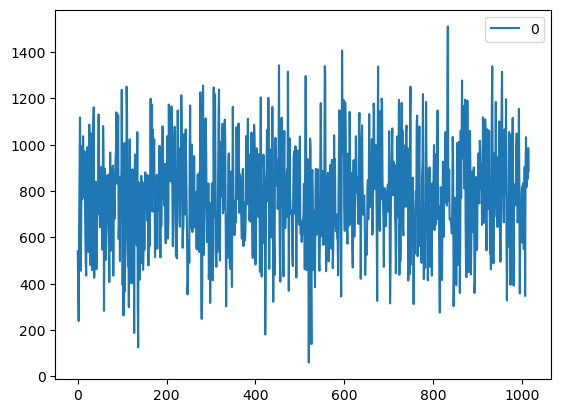

In [129]:
pd.DataFrame(raw_data[2]).plot()

In [105]:
len(raw_data[0][1016:])

1016

In [106]:
count = 0
for i in range(len(raw_data)):
    if len(raw_data[i]) > 1016:
        count += 1
count

654

In [107]:
for i in range(len(raw_data)):
    if len(raw_data[i]) > 1016:
        raw_data[i] = raw_data[i][:1016]

In [108]:
count = 0
for i in range(len(raw_data)):
    if len(raw_data[i]) > 1016:
        count += 1
count

0

In [109]:
raw_data = pd.DataFrame(raw_data)

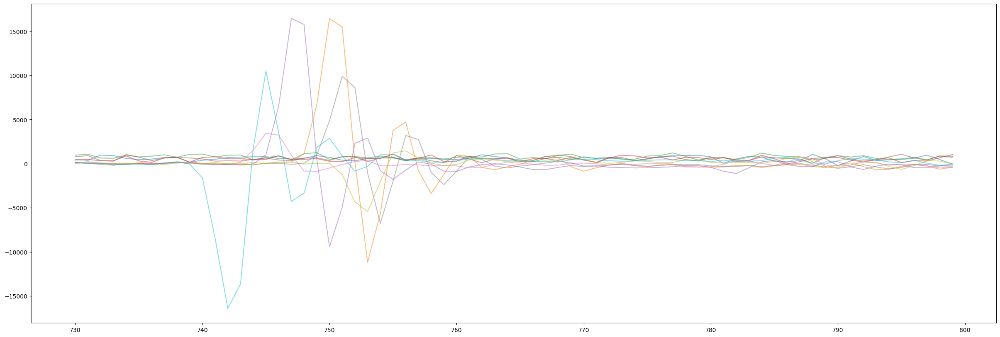

In [110]:
plt.figure(figsize=(30, 10))

for i in range(10):
    # 투명도 0.5로 그래프 그리기
    # matplotlib의 plot 함수를 사용
    plt.plot(raw_data.iloc[i][730:800], alpha=0.5)
plt.show()

<Axes: >

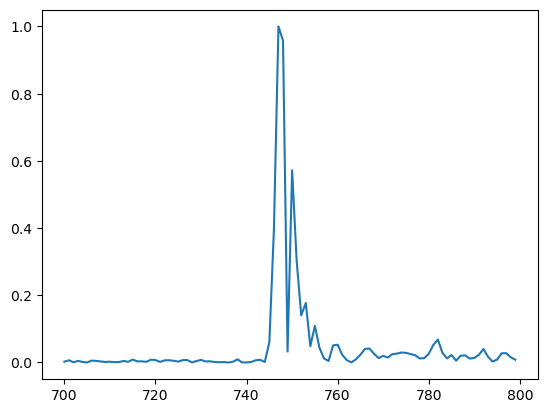

In [111]:
abs_normalized_data = raw_data.abs()
abs_normalized_data = abs_normalized_data.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=1)
abs_normalized_data.iloc[4][700:800].plot()